In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Importing the DataSet

In [3]:
# rain_data = pd.read_csv('https://raw.github.com/FlipRoboTechnologies/ML_-Datasets/blob/main/Rainfall%20Forecast/Rainfall.csv')
data = pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Rainfall%20Forecast/Rainfall.csv')
data.head()


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
rain_data = data.copy()

In [5]:
rain_data.shape

(8425, 23)

In [6]:
data.shape

(8425, 23)

*So we are getting information as follows -

A) Number of Rows = 8425

B) Number of Columns = 23 *

In [7]:
column = rain_data.columns
print(column)

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

*Observations :*

1) Total Number of Columns : 2

2) Number of Float datatype columns : 16

3) Number of Object datatype columns : 7

In [9]:
# Checking for null values present in our Dataset

data.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

<Axes: >

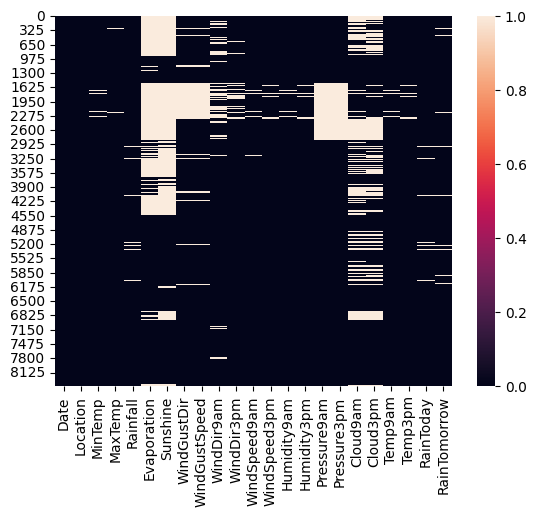

In [10]:
# Visualizing Null values by heatmap

sns.heatmap(data.isnull())

*As we can see there is null values present in our dataset ,  So we need to handle these null values.*

*Handling Null Values seperately for Categorical and Numerical Columns*

In [78]:
#data = rain_data.copy()

In [11]:
# Handling Null values for Categorical columns.

cat_col = data.select_dtypes(include=['object']).columns
print(cat_col)

Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')


In [12]:
# Using mode imputation to handle null values in Categorical Values.

for i in cat_col :
  data[i] = data[i].fillna(data[i].mode()[0])

In [13]:
# Handling Null Values for Numerical Columns.

num_col = data.select_dtypes(include=['float']).columns
print(num_col)

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')


In [14]:
# Implementing Mode imputation to handle null values in numerical columns.

for i in num_col :
  data[i] = data[i].fillna(data[i].mean())

In [15]:
data.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [16]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,5.389395,7.632205,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,5.389395,7.632205,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,5.389395,7.632205,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,5.389395,7.632205,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,5.389395,7.632205,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No


<Axes: >

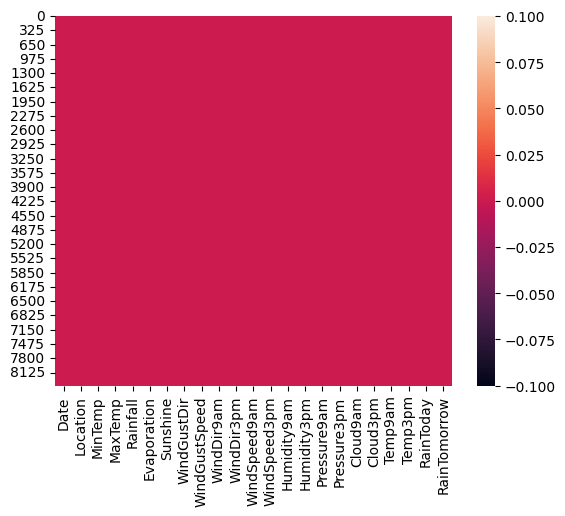

In [17]:
sns.heatmap(data.isnull())

<Axes: >

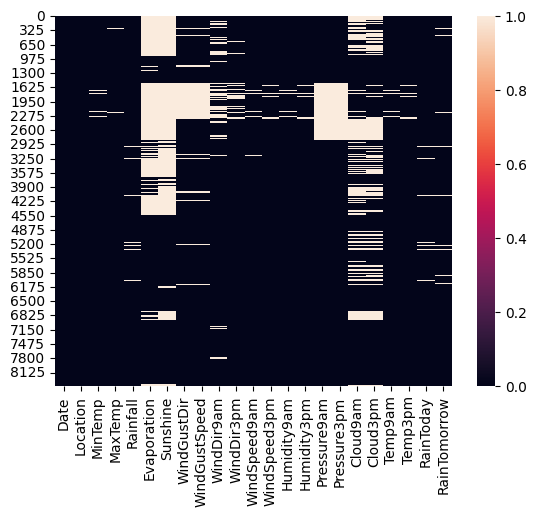

In [18]:
# Visualizing Again for null values by checking heatmap

sns.heatmap(rain_data.isnull())

*Here , We can say that there is no null values present in our dataset.*

In [19]:
# converting Date columns

data['Day'] = data['Date'].str.split('-').str[2]
data['Month'] = data['Date'].str.split('-').str[1]
data['Year'] = data['Date'].str.split('-').str[0]

In [20]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,2008-12-01,Albury,13.4,22.9,0.6,5.389395,7.632205,W,44.0,W,...,1007.1,8.000000,4.503183,16.9,21.8,No,No,01,12,2008
1,2008-12-02,Albury,7.4,25.1,0.0,5.389395,7.632205,WNW,44.0,NNW,...,1007.8,4.566622,4.503183,17.2,24.3,No,No,02,12,2008
2,2008-12-03,Albury,12.9,25.7,0.0,5.389395,7.632205,WSW,46.0,W,...,1008.7,4.566622,2.000000,21.0,23.2,No,No,03,12,2008
3,2008-12-04,Albury,9.2,28.0,0.0,5.389395,7.632205,NE,24.0,SE,...,1012.8,4.566622,4.503183,18.1,26.5,No,No,04,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,5.389395,7.632205,W,41.0,ENE,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,05,12,2008


In [21]:
data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [22]:
# Converting datatype for newly created feature

data['Day'] = data['Day'].astype(int)
data['Month'] = data['Month'].astype(int)
data['Year'] = data['Year'].astype(int)

In [23]:
data.nunique()

Date             3004
Location           12
MinTemp           286
MaxTemp           332
Rainfall          251
Evaporation       117
Sunshine          141
WindGustDir        16
WindGustSpeed      53
WindDir9am         16
WindDir3pm         16
WindSpeed9am       35
WindSpeed3pm       36
Humidity9am        91
Humidity3pm        95
Pressure9am       385
Pressure3pm       375
Cloud9am           10
Cloud3pm           10
Temp9am           305
Temp3pm           329
RainToday           2
RainTomorrow        2
Day                31
Month              12
Year               10
dtype: int64

*Almost all columns have unique values.*

In [24]:
data['Location'].unique()

array(['Albury', 'CoffsHarbour', 'Newcastle', 'Penrith', 'Williamtown',
       'Wollongong', 'Melbourne', 'Brisbane', 'Adelaide', 'PerthAirport',
       'Darwin', 'Uluru'], dtype=object)

# ***EDA : EXPLORATORY DATA ANALYSIS***

# *Uni-Variate Analysis*

<ipython-input-25-9e1fa0b457bc>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = data['Location'] , palette = 'Set1')


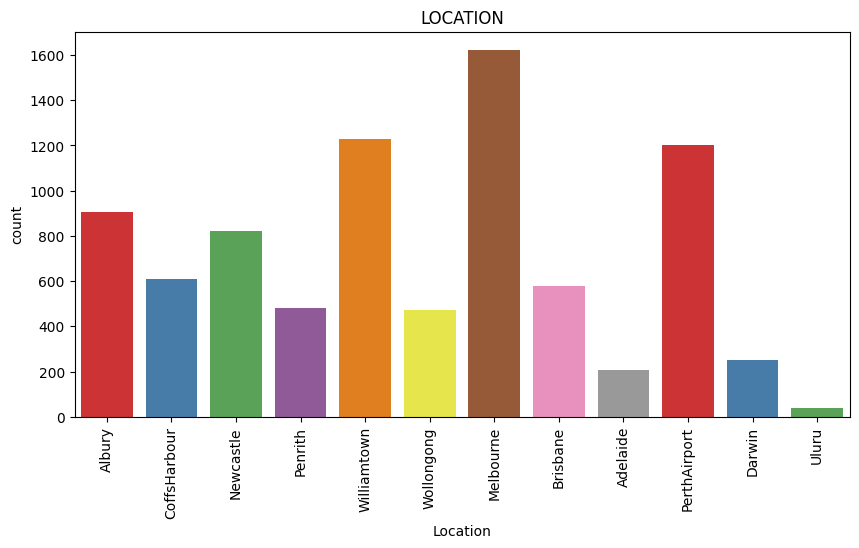

In [25]:
# Visualizing 'Location' column by using countplot.

plt.figure(figsize = (10 , 5))
sns.countplot(x = data['Location'] , palette = 'Set1')
plt.title("LOCATION")
plt.xticks(rotation = 90)
plt.show()

*High Rainfall is predicted for 'Mellbourne'location then for 'Williamtown' and 'PerthAirport'and lowest is predicted for 'Uluru' , 'Adelaide' then 'Darwin'.*

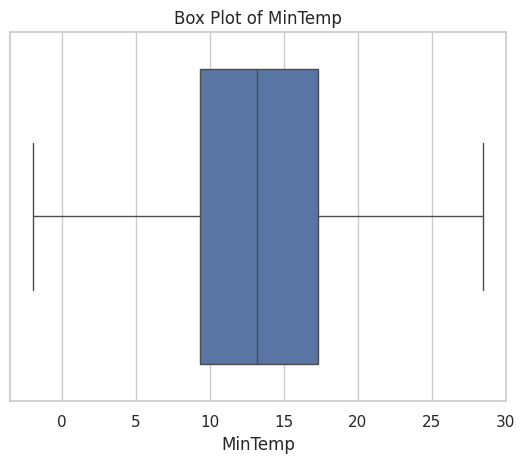

In [94]:
sns.boxplot(x=data['MinTemp'])
plt.xlabel('MinTemp')
plt.title('Box Plot of MinTemp')
plt.show()

<Axes: xlabel='MinTemp', ylabel='Density'>

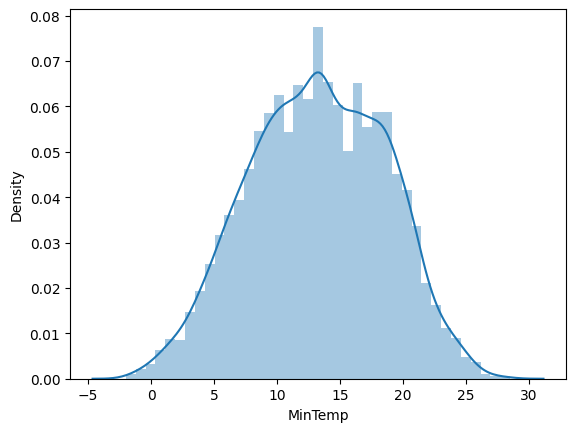

In [26]:
# VIsualizing 'MinTemp' column distplot.

import warnings
warnings.filterwarnings('ignore')
sns.distplot(data['MinTemp'])

*MinTemp column shows normal curve having range 5 to 20.*

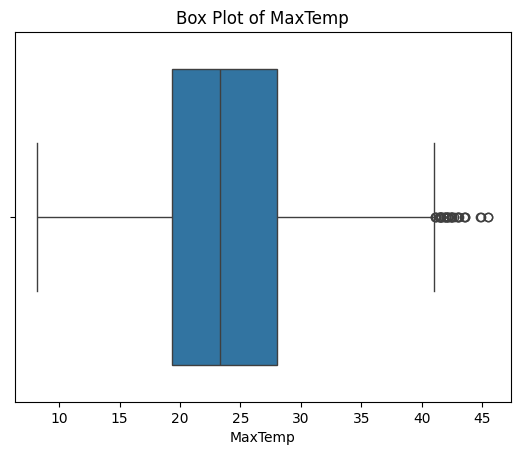

In [ ]:
sns.boxplot(x=data['MaxTemp'])
plt.xlabel('MaxTemp')
plt.title('Box Plot of MaxTemp')
plt.show()


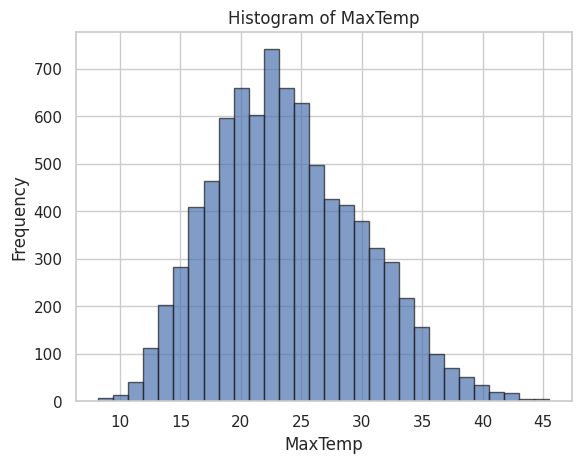

In [ ]:
import matplotlib.pyplot as plt

plt.hist(data['MaxTemp'], bins=30, edgecolor='k', alpha=0.7)
plt.xlabel('MaxTemp')
plt.ylabel('Frequency')
plt.title('Histogram of MaxTemp')
plt.show()


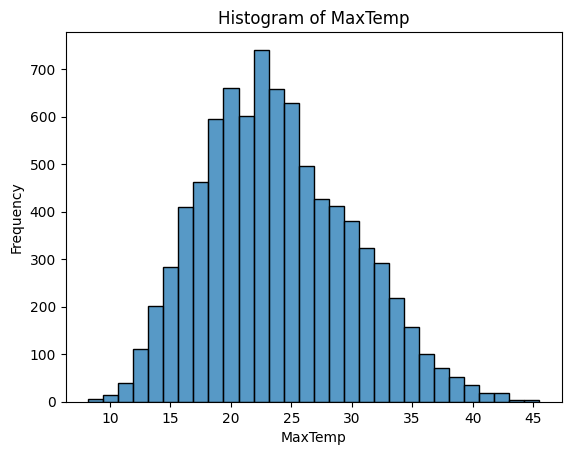

In [ ]:
import seaborn as sns

sns.histplot(data['MaxTemp'], bins=30, kde=False)
plt.xlabel('MaxTemp')
plt.ylabel('Frequency')
plt.title('Histogram of MaxTemp')
plt.show()


<Axes: xlabel='MaxTemp', ylabel='Density'>

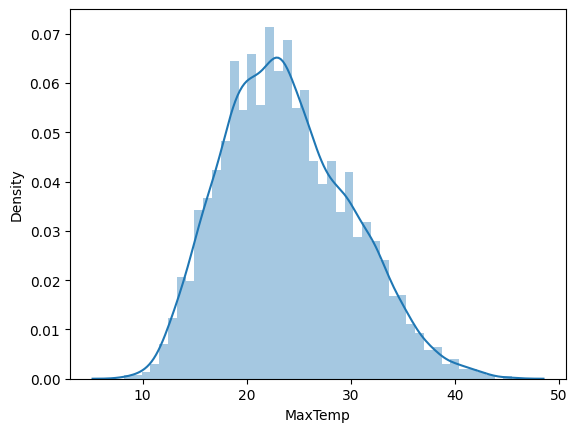

In [27]:
# Visualizing 'MaxTemp' column using distplot.

sns.distplot(data['MaxTemp'])

*MinTemp column shows normal curve having range 20 to 30.*

<Axes: xlabel='Rainfall', ylabel='Density'>

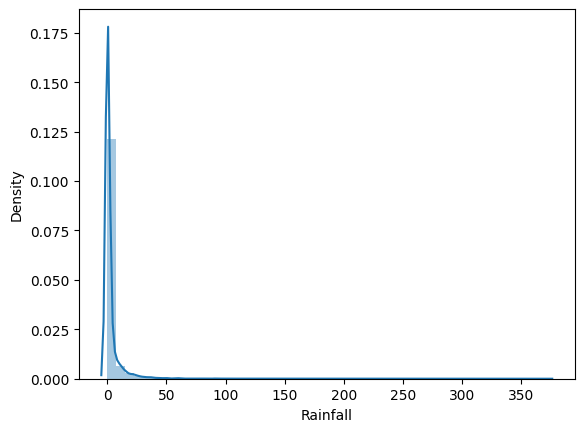

In [28]:
# Visualizing 'Rainfall' Column by using Distplot.

sns.distplot(data['Rainfall'])

*Here , 'Rainfall' column shows most of the data points are concentrated near zero that means the column contains skewness.*

<Axes: xlabel='Evaporation', ylabel='Density'>

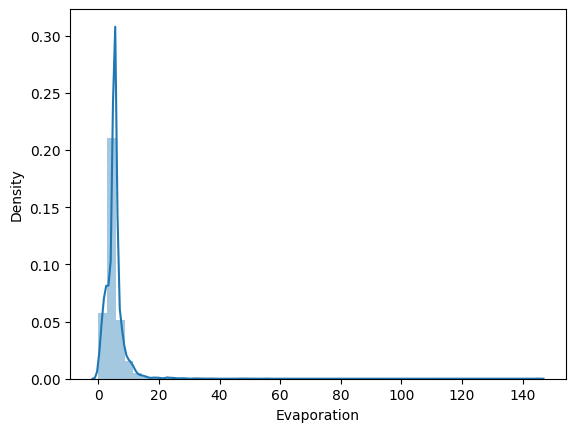

In [29]:
#Visualizing 'Evaporation' column by using Distplot.

sns.distplot(data['Evaporation'])

*Here, 'Evaporation' column also shows that most of the values lies near zero and it shows skewness.*

<Axes: xlabel='Sunshine', ylabel='Density'>

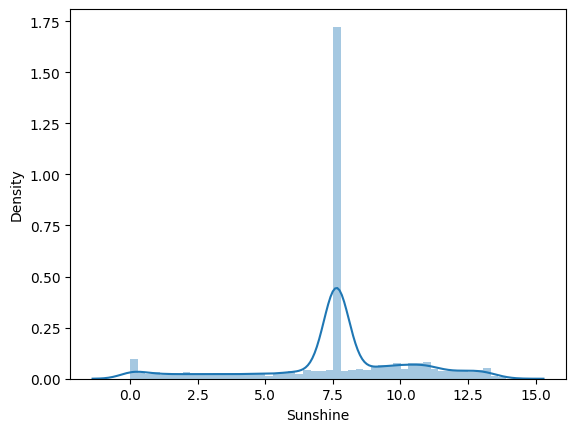

In [30]:
# Visualizing "Sunshine" column by using Distplot.
sns.distplot(data['Sunshine'])

*Here, 'Sunshine' column shows a small normal curve with median at 7.5.*

<Axes: xlabel='WindGustSpeed', ylabel='Density'>

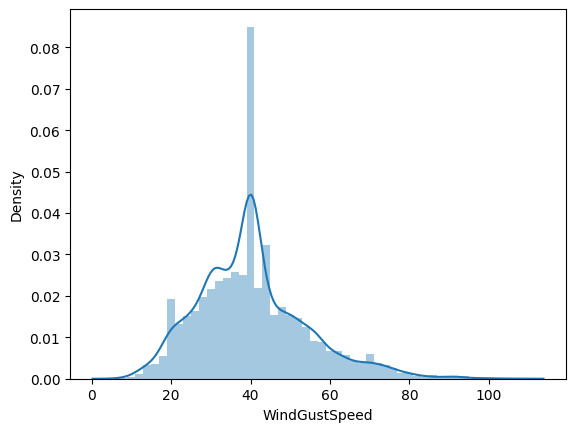

In [31]:
# Visualizing 'WindGustSpeed' column by using distplot.
sns.distplot(data['WindGustSpeed'])

*Here , 'WindGustSpeed' columns shows somewhat normal trend but little bit skewness with range 20-60.*

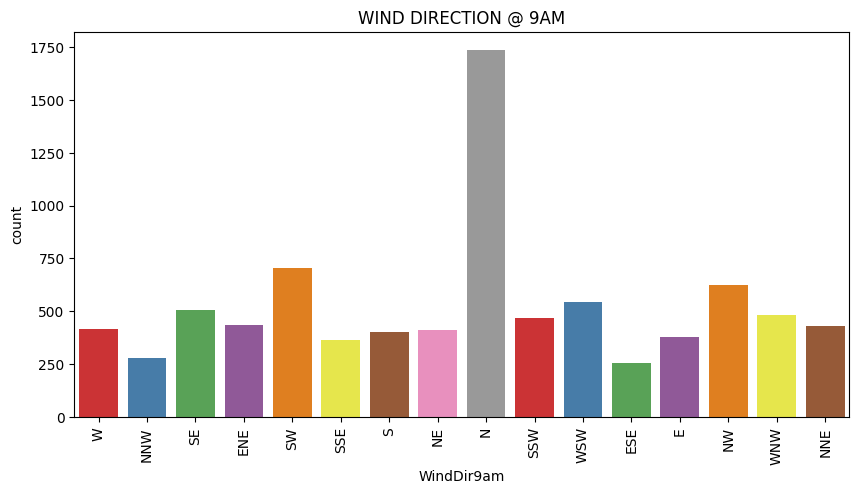

In [32]:
plt.figure(figsize = (10 ,5))
sns.countplot(x = data['WindDir9am'] , palette = 'Set1')
plt.xticks(rotation = 90)
plt.title("WIND DIRECTION @ 9AM")
plt.show()

*Here , 'WindDir9am' column shows wind speed is mostly in North direction and less in ESE and NNW at 9 am.
*

In [33]:
print(data['WindDir9am'].unique())
print(data['WindSpeed3pm'].unique())

['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' 'N' 'SSW' 'WSW' 'ESE' 'E' 'NW'
 'WNW' 'NNE']
[24.         22.         26.          9.         20.         17.
 28.         11.          6.         13.         30.         19.
 31.          7.         15.         48.          4.         33.
  0.          2.         18.53366194 37.         46.         39.
 50.         35.         41.         44.         43.         65.
 56.         83.         54.         61.         57.         52.        ]


[]

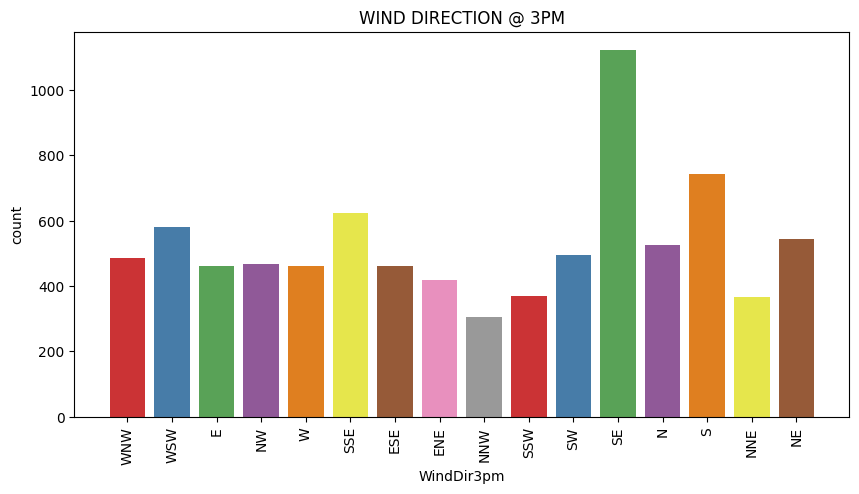

In [34]:
plt.figure(figsize=(10 , 5))
sns.countplot(x= data['WindDir3pm'] , palette = 'Set1')
plt.xticks(rotation = 90)
plt.title("WIND DIRECTION @ 3PM")
plt.plot()

*Here , 'WindDir3pm' column shows wind direction is mostly SE & S and less in NNW , & SSW.
*

<Axes: xlabel='Humidity9am', ylabel='Density'>

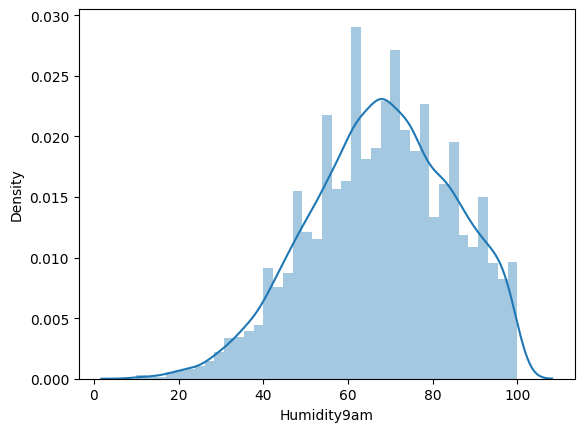

In [35]:
sns.distplot(data['Humidity9am'])

*Here , 'Humidity9am' column shows somewhat skewness with range 40-80 at 9AM*

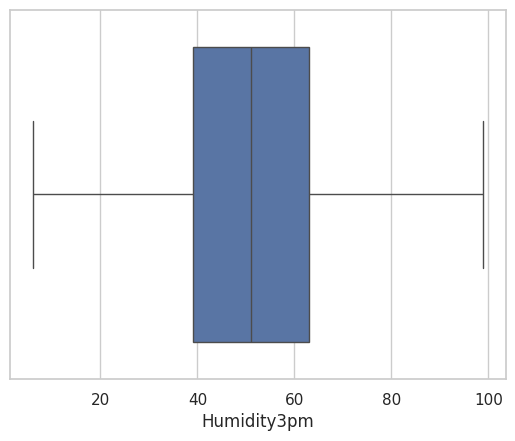

In [ ]:
sns.boxplot(x = data['Humidity3pm'])
plt.xlabel("Humidity3pm")
plt.show()

<Axes: xlabel='Humidity3pm', ylabel='Density'>

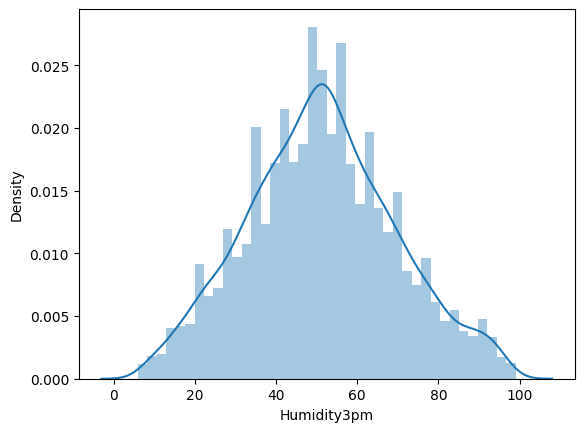

In [36]:
sns.distplot(data['Humidity3pm'])

*Here , 'Humidity3pm' column shows normal curve with most humidity in range 40-80 at 3pm.*

<Axes: xlabel='Pressure9am', ylabel='Density'>

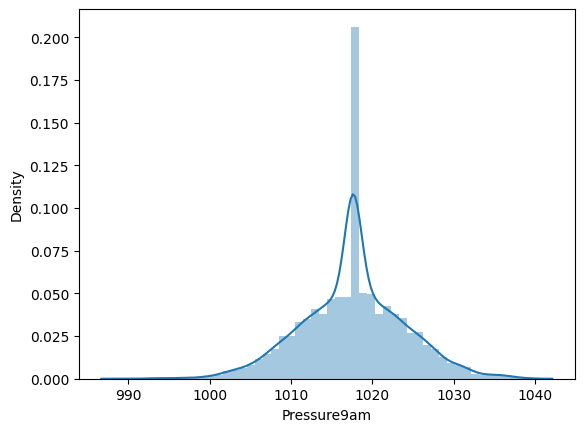

In [37]:
sns.distplot(data['Pressure9am'])

*Here , above plot show that 'Pressure9am' column shows somewhat normal curve between 1010 & 1020.*

<Axes: xlabel='Pressure3pm', ylabel='Density'>

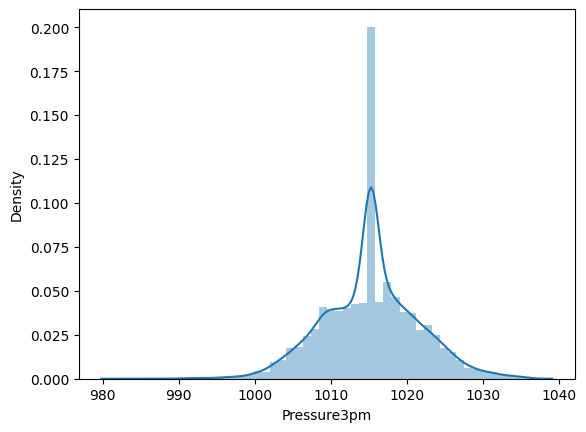

In [38]:
sns.distplot(data['Pressure3pm'])

*As we can see that , 'Pressure3pm' column shows same normal curve as 'Pressure9am'.*

<Axes: xlabel='Cloud3pm', ylabel='Density'>

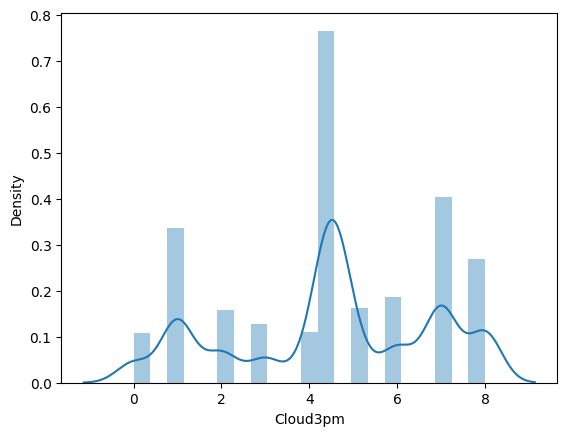

In [39]:
sns.distplot(data['Cloud3pm'])

<Axes: xlabel='Cloud9am', ylabel='Density'>

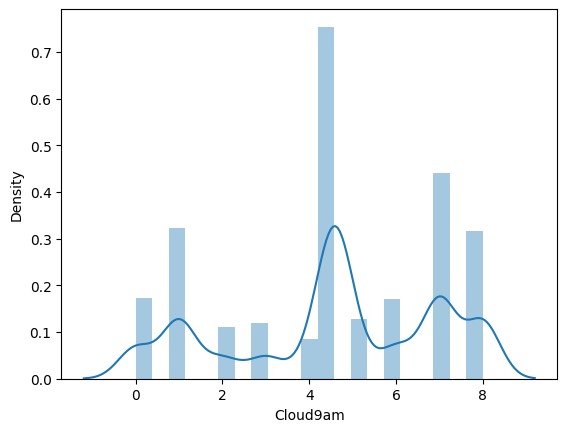

In [40]:
sns.distplot(data['Cloud9am'])

*As we can see that , Both 'Cloud9am' and 'Cloud3pm' shows almost same curve.*

<Axes: xlabel='Temp9am', ylabel='Density'>

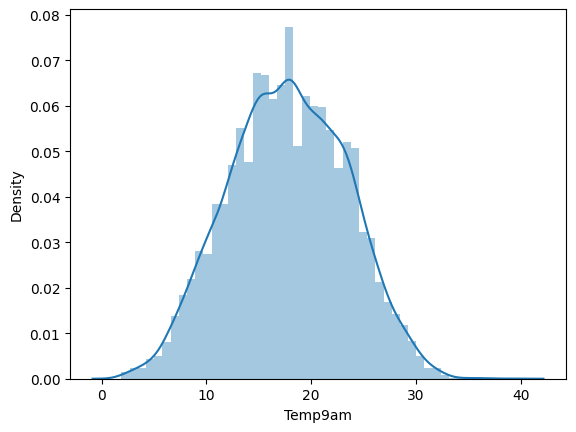

In [41]:
sns.distplot(data['Temp9am'])

<Axes: xlabel='Temp3pm', ylabel='Density'>

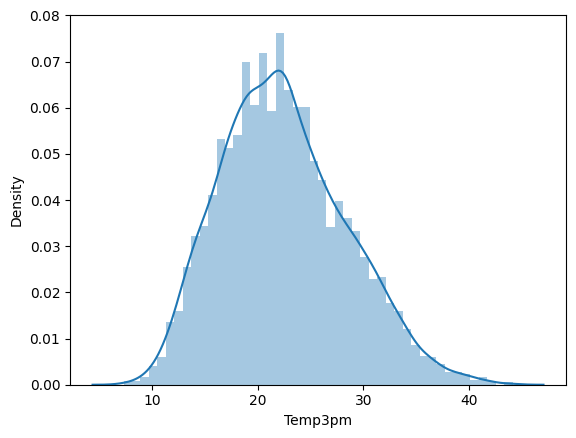

In [42]:
#data.info(['Temp3pm'])
sns.distplot(data['Temp3pm'])

*Here , Both 'Temp9am' and 'Temp3pm' shows perfect normal curve.*

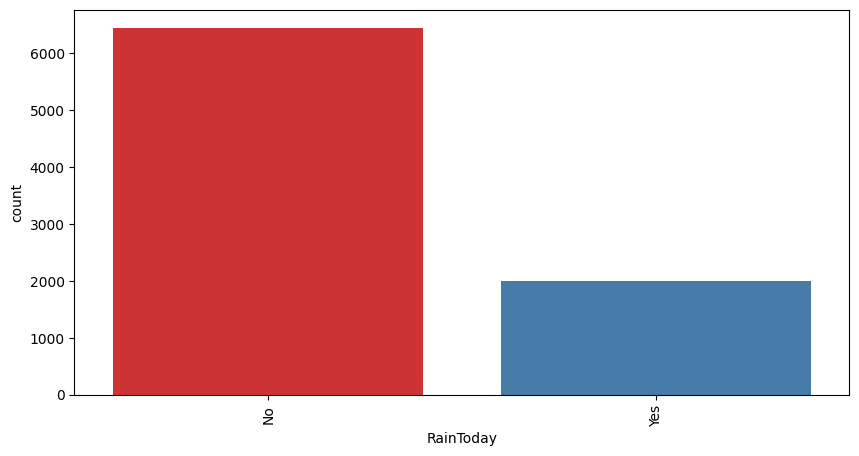

In [43]:
# visualizing 'Raintoday column by using countplot.

plt.figure(figsize = (10 , 5))
sns.countplot(x = data['RainToday'] , palette = 'Set1')
plt.xticks(rotation = 90)
plt.show()

*As we can see that , 'RainToday' column shows mostly no rainfall.*

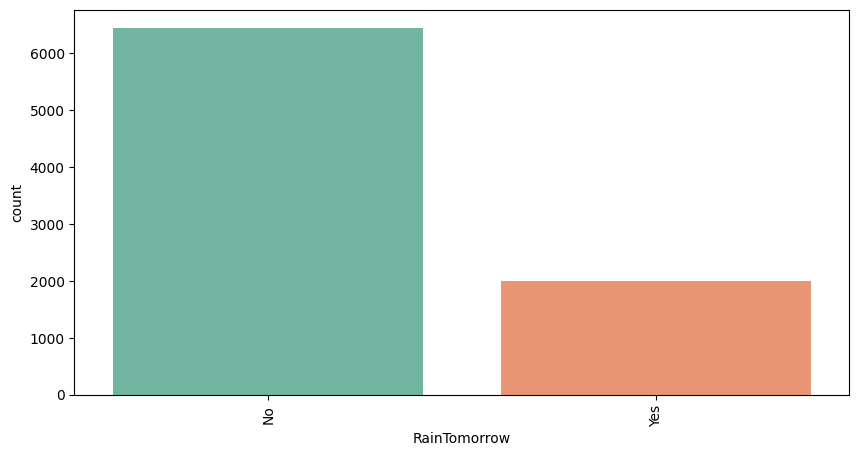

In [44]:
# Visualizing 'RainTomorrow' column by using countplot.

plt.figure(figsize = (10 , 5))
sns.countplot(x = data['RainTomorrow'] , palette = 'Set2')
plt.xticks(rotation = 90)
plt.show()

*Here we can see that , 'RainTomorrow' column shows less rainfall in majority.*

We will combine 'WindSpeed9am' and 'WindSpeed3pm','Humidity9am' and 'Humidity3pm', 'Cloud9am' and 'Cloud3pm', 'Temp9am' and 'Temp3pm', 'Pressure9am' and 'Pressure3pm' columns into average of them as they have equal values.

In [45]:
data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [47]:
data['Avg_WindSpeed']=(data['WindSpeed9am']+data['WindSpeed3pm'])/2

data['Avg_Humidity']=(data['Humidity9am']+data['Humidity3pm'])/2

data['Avg_Cloud']=(data['Cloud9am']+data['Cloud3pm'])/2

data['Avg_Temp'] = (data['Temp9am']+data['Temp3pm'])/2

data['Avg_Pressure']=(data['Pressure9am']+data['Pressure3pm'])/2

In [48]:
# Dropping irrelevant columns
data = data.drop(columns = ['Date' , 'WindSpeed3pm' , 'WindSpeed9am' , 'Humidity3pm' , 'Humidity9am' , 'Cloud3pm' , 'Cloud9am' , 'Temp3pm' , 'Temp9am' , 'Pressure3pm' , 'Pressure9am'])


In [49]:
data.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow', 'Day', 'Month', 'Year', 'Avg_WindSpeed', 'Avg_Humidity',
       'Avg_Cloud', 'Avg_Temp', 'Avg_Pressure'],
      dtype='object')

<Axes: xlabel='Avg_WindSpeed', ylabel='Density'>

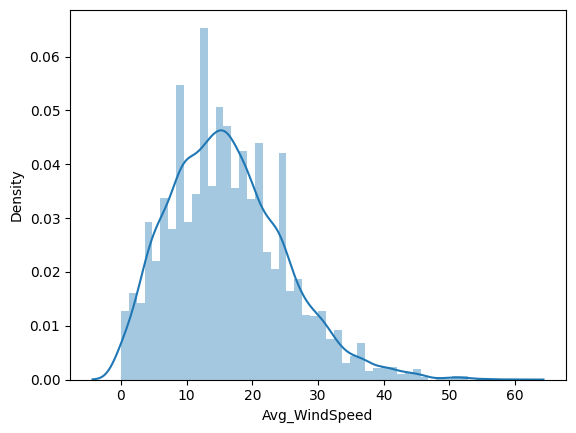

In [50]:
sns.distplot(data['Avg_WindSpeed'])

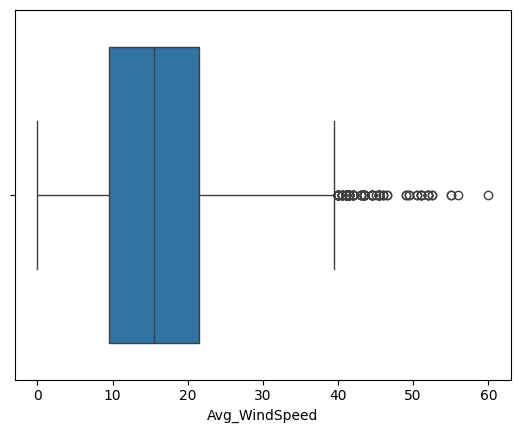

In [52]:
sns.boxplot(x = data['Avg_WindSpeed'])
plt.xlabel("Avg_WindSpeed")
plt.show()

<Axes: xlabel='Avg_Cloud', ylabel='Density'>

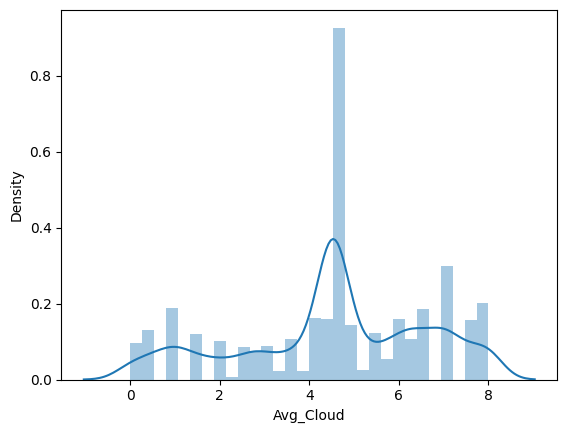

In [53]:
sns.distplot(data['Avg_Cloud'])

<Axes: ylabel='Density'>

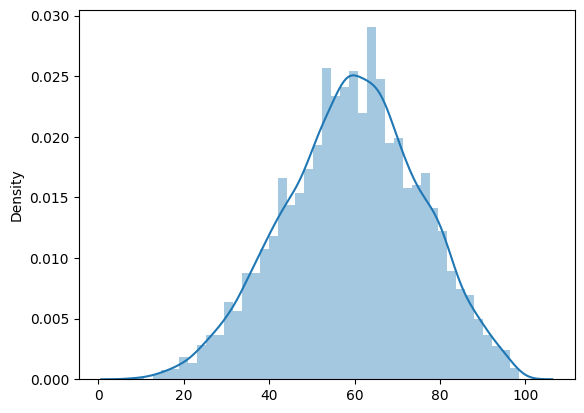

In [54]:
sns.distplot(data[['Avg_Humidity']])

<Axes: xlabel='Avg_Pressure', ylabel='Density'>

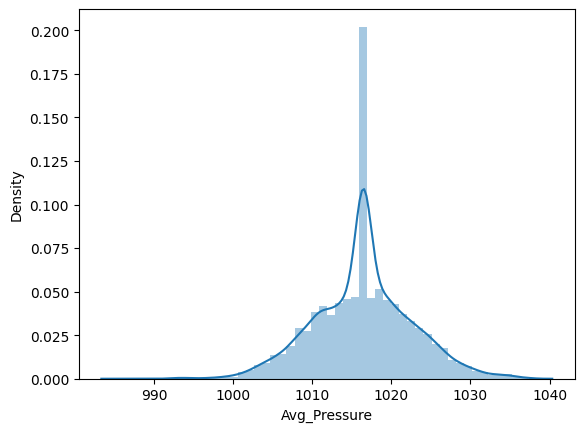

In [55]:
sns.distplot(data['Avg_Pressure'])

<Axes: xlabel='Avg_Temp', ylabel='Density'>

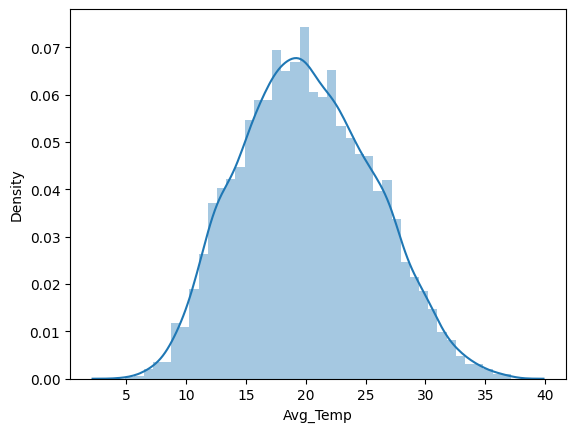

In [56]:
sns.distplot(data['Avg_Temp'])

# **BI-VARIATE DATA ANALYSI**

Text(0.5, 1.0, 'Distribution of Average Wind Speed by Rain Tomorrow')

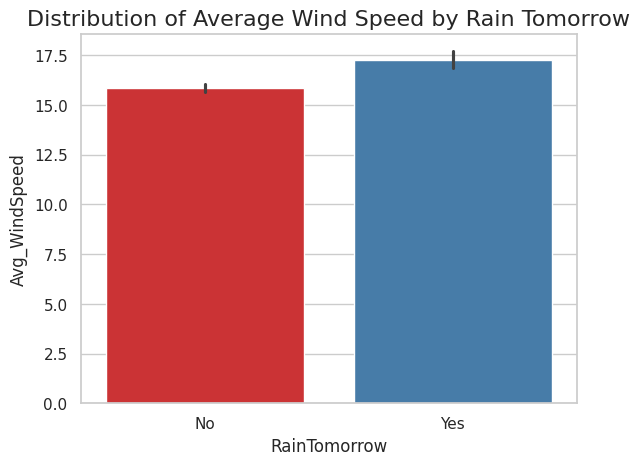

In [57]:
# Visualizing 'Avg_Speed' vs 'RainTomorrow' by using barplot.
sns.set(style="whitegrid")
sns.barplot(x = 'RainTomorrow' , y = 'Avg_WindSpeed' , data = data , palette = 'Set1')
plt.title('Distribution of Average Wind Speed by Rain Tomorrow', fontsize=16)



# # Setting the aesthetic style of the plots
# sns.set(style="whitegrid")

# # Create a boxplot
# plt.figure(figsize=(10, 6))
# sns.boxplot(x='RainTomorrow', y='Avg_WindSpeed', data=data, palette='Set1')

# # Adding titles and labels
# plt.title('Distribution of Average Wind Speed by Rain Tomorrow', fontsize=16)
# plt.xlabel('Rain Tomorrow', fontsize=14)
# plt.ylabel('Average Wind Speed', fontsize=14)

# # Display the plot
# plt.show()


# # Create a violin plot
# plt.figure(figsize=(10, 6))
# sns.violinplot(x='RainTomorrow', y='Avg_WindSpeed', data=data, palette='Set1')

# # Adding titles and labels
# plt.title('Distribution of Average Wind Speed by Rain Tomorrow', fontsize=16)
# plt.xlabel('Rain Tomorrow', fontsize=14)
# plt.ylabel('Average Wind Speed', fontsize=14)

# # Display the plot
# plt.show()

# Create a swarm plot
# plt.figure(figsize=(10, 6))
# sns.swarmplot(x='RainTomorrow', y='Avg_WindSpeed', data=data, palette='Set1')

# # Adding titles and labels
# plt.title('Distribution of Average Wind Speed by Rain Tomorrow', fontsize=16)
# plt.xlabel('Rain Tomorrow', fontsize=14)
# plt.ylabel('Average Wind Speed', fontsize=14)

# # Display the plot
# plt.show()

*Here , we can clearly say that Avg_WindSpeed has maximum rainfall for tomorrow.*

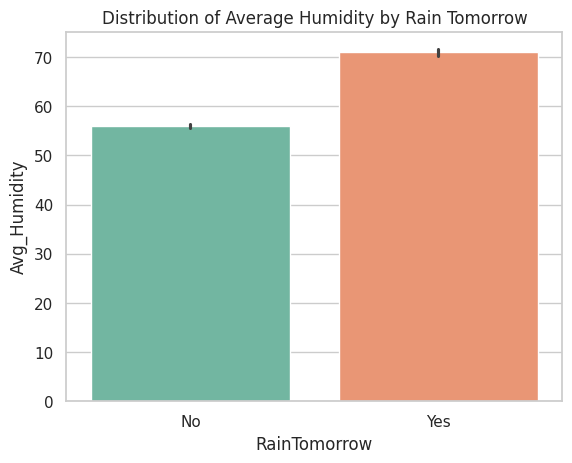

In [58]:
# Visualizing "Avg_Humidity" vs "RainTomorrow" by using BarPlot

sns.set(style = 'whitegrid')
sns.barplot(x = 'RainTomorrow' , y = 'Avg_Humidity' , data = data , palette='Set2')
plt.title("Distribution of Average Humidity by Rain Tomorrow")
plt.show()

*Here , we can see that Avg_Humidity shows maximum rainfall for RainTomorrow. *

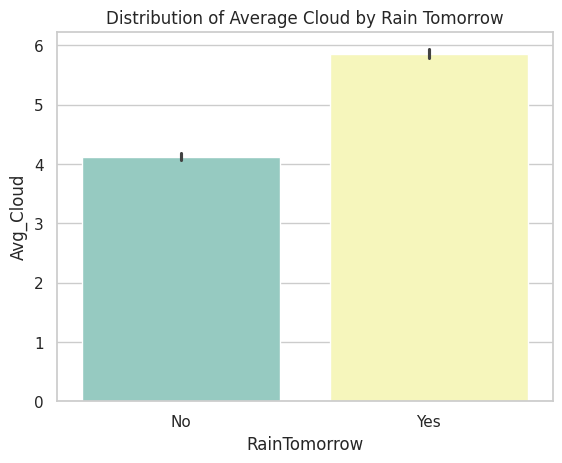

In [59]:
# Visualizing "Avg_Cloud" vs "RainTomorrow" by using BarPlot

sns.set(style = 'whitegrid')
sns.barplot(x = 'RainTomorrow' , y = 'Avg_Cloud' , data = data , palette='Set3')
plt.title("Distribution of Average Cloud by Rain Tomorrow")
plt.show()

*Here , we can see that Avg_Cloud shows maximum rainfall for RainTomorrow. *

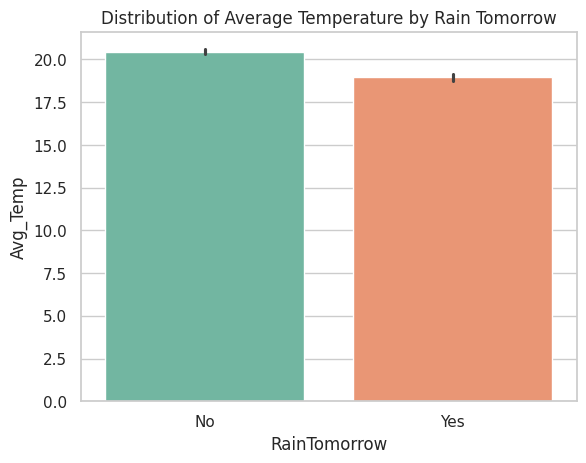

In [60]:
# Visualizing "Ave_Temp" vs "RainTomorrow" column by using BarPlot


sns.set(style = 'whitegrid')
sns.barplot(x = 'RainTomorrow' , y = 'Avg_Temp' , data = data , palette='Set2')
plt.title("Distribution of Average Temperature by Rain Tomorrow")
plt.show()

*Average temperature shows less rainfall for rain Tomorrow.*

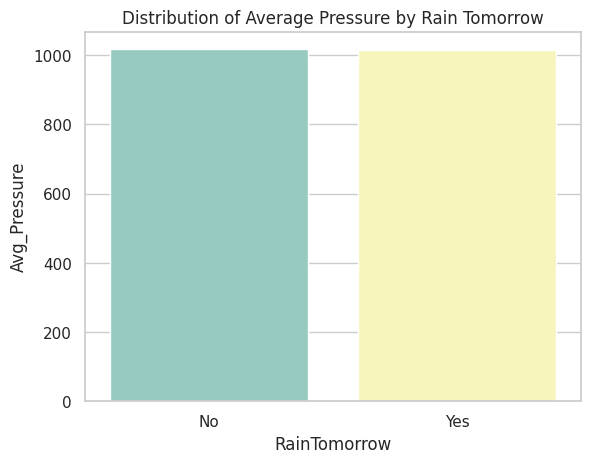

In [62]:
# Visualizing "Avg_Pressure" vs "RainTomorrow" by using BarPlot

sns.set(style = 'whitegrid')
sns.barplot(x = 'RainTomorrow' , y = 'Avg_Pressure' , data = data , palette='Set3')
plt.title("Distribution of Average Pressure by Rain Tomorrow")
plt.show()

*As we can see that Avg_Pressure shows same Rainfall for Rain Tomorrow.*

# **DATA ENCODING**

In [63]:
# Encoding Dataset by using Label Encoder.

from sklearn.preprocessing import LabelEncoder

LE = LabelEncoder()

obj = data.select_dtypes(include = ['object']).columns


In [64]:
for i in obj :
  data[i] = LE.fit_transform(data[i])


In [65]:
data.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Day,Month,Year,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,1,13.4,22.9,0.6,5.389395,7.632205,13,44.0,13,14,0,0,1,12,2008,22.0,46.5,6.251591,19.35,1007.40
1,1,7.4,25.1,0.0,5.389395,7.632205,14,44.0,6,15,0,0,2,12,2008,13.0,34.5,4.534902,20.75,1009.20
2,1,12.9,25.7,0.0,5.389395,7.632205,15,46.0,13,15,0,0,3,12,2008,22.5,34.0,3.283311,22.10,1008.15
3,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,9,0,0,0,4,12,2008,10.0,30.5,4.534902,22.30,1015.20
4,1,17.5,32.3,1.0,5.389395,7.632205,13,41.0,1,7,0,0,5,12,2008,13.5,57.5,7.500000,23.75,1008.40


*Categorical Columns have been successfully encoded.*

# *MULTIVARIATE ANALYSIS*

<Figure size 4000x6000 with 0 Axes>

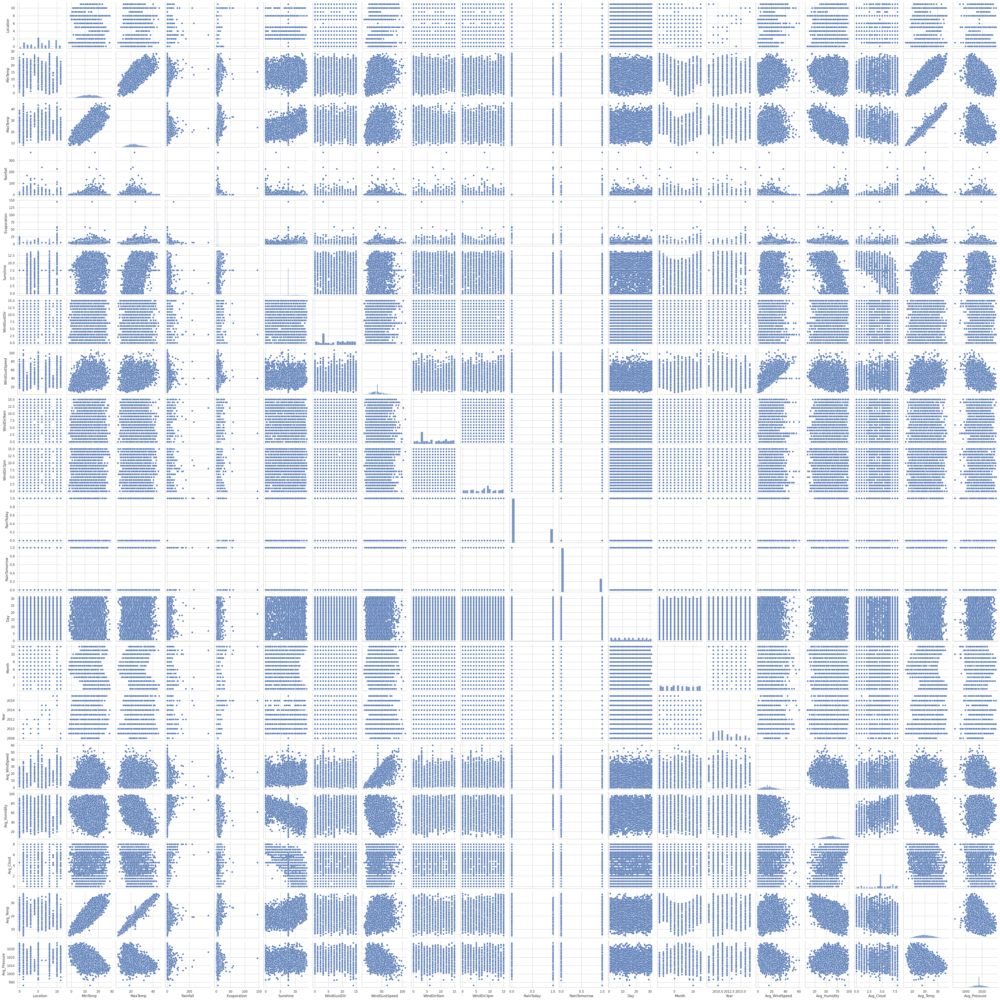

In [66]:
# By using Pairplot

plt.figure(figsize = (40 , 60))
sns.pairplot(data)
plt.show()

# *Checking for Correlation*

In [67]:
data.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Day,Month,Year,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
Location,1.000000,0.116531,0.064268,0.007693,0.143519,0.057817,-0.035408,0.231396,-0.027103,-0.027736,0.003071,0.002824,-0.002019,-0.082407,0.486405,0.256365,0.035209,0.031629,0.092380,-0.026704
MinTemp,0.116531,1.000000,0.717522,0.087684,0.254965,0.056184,-0.145316,0.230058,-0.041650,-0.147166,0.064789,0.092942,0.009446,-0.245854,0.044123,0.177908,-0.023504,0.074073,0.817991,-0.430397
MaxTemp,0.064268,0.717522,1.000000,-0.087451,0.322405,0.378403,-0.224670,0.139998,-0.214119,-0.180622,-0.224883,-0.152886,0.015608,-0.163253,0.119772,0.056534,-0.450397,-0.284064,0.962593,-0.367873
Rainfall,0.007693,0.087684,-0.087451,1.000000,0.023517,-0.169432,0.038812,0.086000,0.093821,0.038560,0.461106,0.220021,-0.013760,-0.012244,0.006435,0.043000,0.256968,0.189950,-0.052320,-0.053770
Evaporation,0.143519,0.254965,0.322405,0.023517,1.000000,0.226001,-0.078765,0.136371,-0.061677,-0.047952,-0.088654,-0.059012,0.013597,0.004362,0.152708,0.116302,-0.206064,-0.095241,0.324043,-0.185442
Sunshine,0.057817,0.056184,0.378403,-0.169432,0.226001,1.000000,-0.105918,-0.013778,-0.076560,-0.068553,-0.234230,-0.327731,0.004662,-0.006694,0.065374,0.006252,-0.445071,-0.608636,0.339461,-0.006920
WindGustDir,-0.035408,-0.145316,-0.224670,0.038812,-0.078765,-0.105918,1.000000,0.016591,0.403562,0.505799,0.125188,0.051832,0.015683,0.034823,-0.088340,0.067093,0.050219,0.122656,-0.217714,-0.068209
WindGustSpeed,0.231396,0.230058,0.139998,0.086000,0.136371,-0.013778,0.016591,1.000000,-0.072058,0.071235,0.076822,0.190127,-0.002876,0.051968,-0.042402,0.698646,-0.195637,0.056579,0.157450,-0.393791
WindDir9am,-0.027103,-0.041650,-0.214119,0.093821,-0.061677,-0.076560,0.403562,-0.072058,1.000000,0.249527,0.157324,0.032860,-0.015154,0.012544,-0.014498,0.057470,0.085463,0.092133,-0.171355,0.031317
WindDir3pm,-0.027736,-0.147166,-0.180622,0.038560,-0.047952,-0.068553,0.505799,0.071235,0.249527,1.000000,0.100125,0.008918,0.003089,0.029384,-0.005812,0.053121,-0.012479,0.073257,-0.188159,-0.091199


<Axes: >

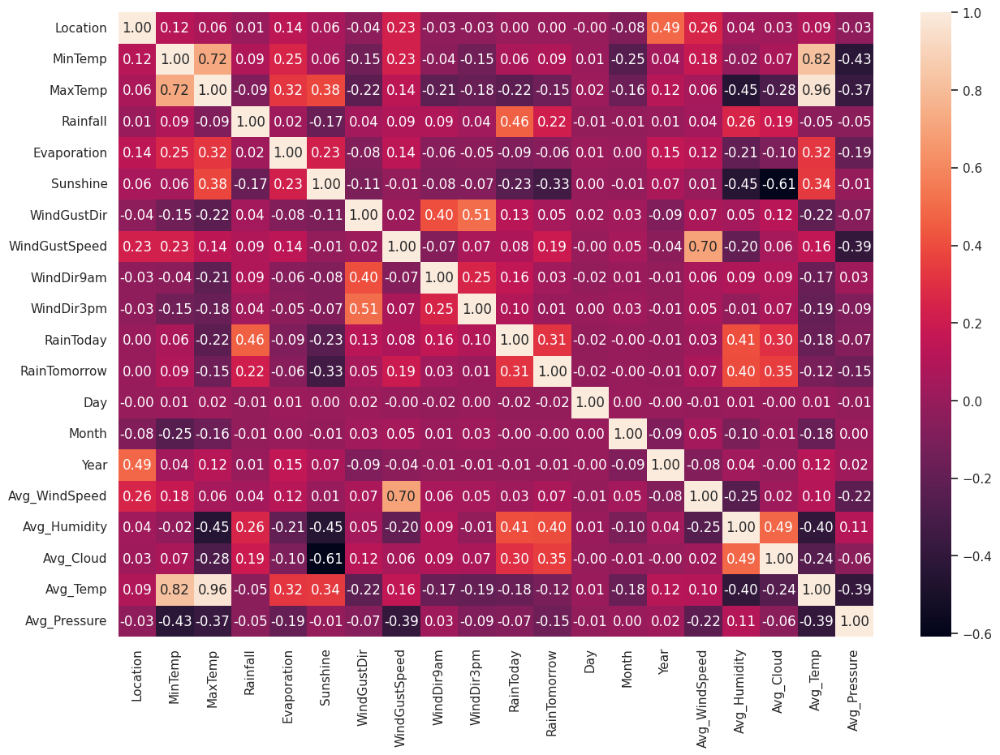

In [68]:
#Visualizing correlation using Heatmap

plt.figure(figsize = (15 , 10))
sns.heatmap(data.corr() , annot = True , cmap = 'rocket' , fmt = '0.2f')

*Here Avg_Temp and MinTemp shows Highest correlation of 0.82, Avg_Temp and MaxTemp shows highest correlation of 0.96, also WindGustSpeed and Avg_WindSpeed shows highest correlation of 0.72.*

# *Spliting the Dataset into Feature and target column for "RainTomorrow" for prediction.*

In [69]:
x = data.drop(['RainTomorrow'] , axis = True)
y = data['RainTomorrow']

In [70]:
print(x.shape)
print(y.shape)

(8425, 19)
(8425,)


# *checking for Skewness*

In [71]:
x.skew().sort_values(ascending = False)

Evaporation      14.023948
Rainfall         13.218403
RainToday         1.242362
WindGustSpeed     0.757000
Avg_WindSpeed     0.644306
Year              0.418663
MaxTemp           0.380654
WindDir9am        0.172792
Avg_Temp          0.170653
WindGustDir       0.119640
Month             0.039388
Avg_Pressure      0.005032
Day               0.004260
Location         -0.050456
MinTemp          -0.089989
WindDir3pm       -0.119847
Avg_Humidity     -0.151055
Avg_Cloud        -0.374727
Sunshine         -0.716525
dtype: float64

*Here the columns 'Evaporation','Rainfall','RainToday','WindGustSpeed','Avg_WindSpeed' have highest skewness and we will remove it using powertransformation.*

In [72]:
from sklearn.preprocessing import power_transform

x_1 = power_transform(x)

In [73]:
pd.DataFrame(x_1 , columns = x.columns).skew().sort_values(ascending = False)

RainToday        1.242362
Rainfall         0.904387
Evaporation      0.080305
WindGustSpeed    0.010481
Avg_Pressure     0.000947
Year             0.000000
MaxTemp         -0.010591
Avg_WindSpeed   -0.023574
Avg_Temp        -0.029065
Avg_Humidity    -0.047725
Sunshine        -0.075544
MinTemp         -0.102983
WindDir9am      -0.155025
Month           -0.155749
Location        -0.186657
WindGustDir     -0.187177
Avg_Cloud       -0.192919
Day             -0.211250
WindDir3pm      -0.248689
dtype: float64

*We have successfully removed the Skewness in the DataSet.*

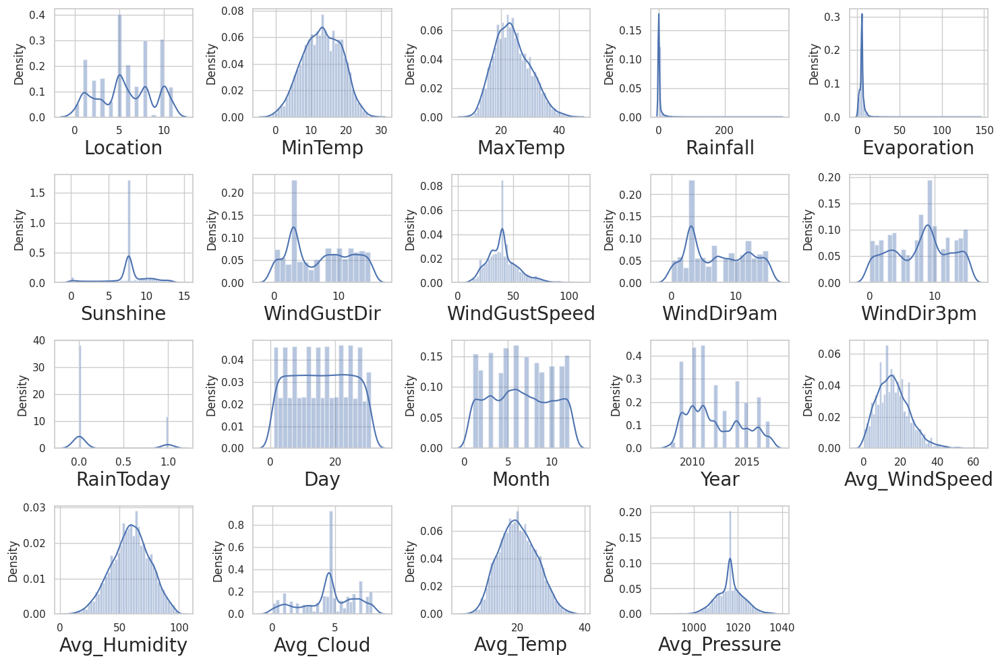

In [74]:
# Visualizing the skewness by using distplot in the Dataset.

plt.figure(figsize = (15,10))
plotnumber = 1

for i in x :
  if plotnumber <= 20 :
    ax = plt.subplot(4 , 5 , plotnumber)
    sns.distplot(x[i])
    plt.xlabel(i , fontsize = 20)
  plotnumber += 1
plt.tight_layout()

# Outliers Detection & Handling

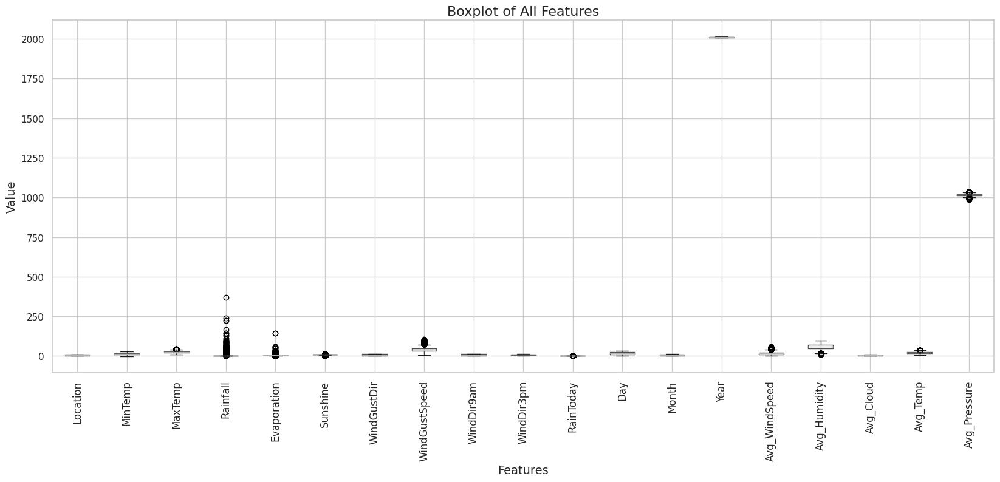

In [75]:
# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Create a boxplot for all columns in the dataframe
plt.figure(figsize=(20, 10))
x.iloc[:, :].boxplot()

# Adjust layout to fit the xticks and add some spacing
plt.subplots_adjust(bottom=0.3)

# Rotate xticks for better readability
plt.xticks(rotation=90, fontsize=12)

# Add titles and labels
plt.title('Boxplot of All Features', fontsize=16)
plt.xlabel('Features', fontsize=14)
plt.ylabel('Value', fontsize=14)

# Show the plot
plt.show()


*Here from the above boxplot, 'MaxTemp', 'Rainfall' , 'Evaporation','Sunshine','WindGustSpeed','RainToday','Avg_WindSpeed','Avg_Humidity','Avg_Temp',
shows the outliers*

*We need to remove outliers.*

*We will remove the outliers from each features by using IQR method.*

In [77]:
from scipy import stats
# Calculate Z-scores
z_scores = np.abs(stats.zscore(data))
# Set a threshold
threshold = 3
# Filter out data points with Z-scores greater than the threshold
data_no_outliers = data[(z_scores < threshold).all(axis=1)]


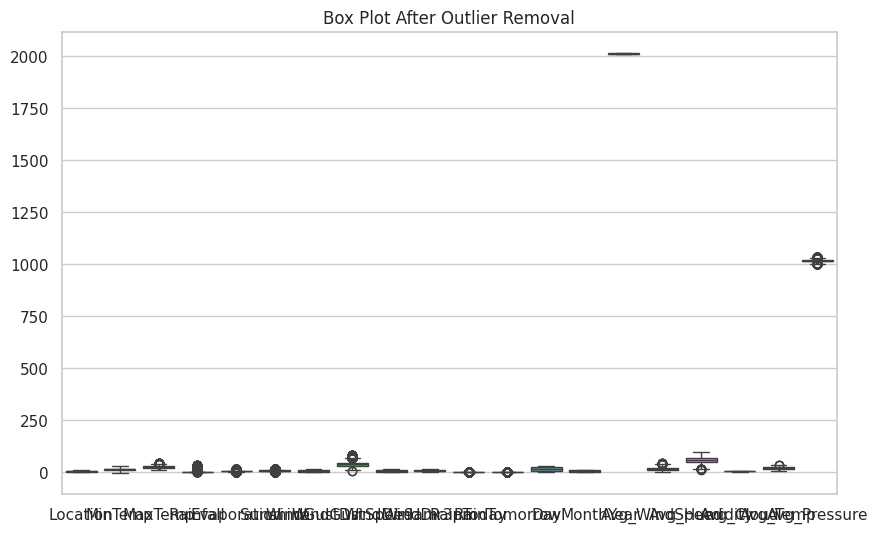

In [78]:
# Visualize using a box plot
plt.figure(figsize=(10, 6))
sns.boxplot(data=data_no_outliers)
plt.title('Box Plot After Outlier Removal')
plt.show()


In [79]:
# Calculate Q1, Q3, and IQR
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1

# Define the bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers
data_no_outliers = data[~((data < lower_bound) | (data > upper_bound)).any(axis=1)]

print("Original Data:")
print(data)
print("\nData after removing outliers:")
print(data_no_outliers)

Original Data:
      Location  MinTemp    MaxTemp  Rainfall  Evaporation  Sunshine  \
0            1     13.4  22.900000       0.6     5.389395  7.632205   
1            1      7.4  25.100000       0.0     5.389395  7.632205   
2            1     12.9  25.700000       0.0     5.389395  7.632205   
3            1      9.2  28.000000       0.0     5.389395  7.632205   
4            1     17.5  32.300000       1.0     5.389395  7.632205   
...        ...      ...        ...       ...          ...       ...   
8420         9      2.8  23.400000       0.0     5.389395  7.632205   
8421         9      3.6  25.300000       0.0     5.389395  7.632205   
8422         9      5.4  26.900000       0.0     5.389395  7.632205   
8423         9      7.8  27.000000       0.0     5.389395  7.632205   
8424         9     14.9  23.859976       0.0     5.389395  7.632205   

      WindGustDir  WindGustSpeed  WindDir9am  WindDir3pm  RainToday  \
0              13      44.000000          13          14     

In [80]:
print(x.shape)
print(y.shape)

(8425, 19)
(8425,)


In [81]:
print(x.shape)
print(y.shape)

(8425, 19)
(8425,)


# **Data Scaling**

In [84]:
# We are going to use StandardScaler for Dataset Scaling.

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# ***Variance Inflation Factor***

In [85]:
# Checking the multicollinearity in dataset with VIF.
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(x_scaled, i) for i in range (x_scaled.shape[1])]
vif['features'] = x.columns
vif

,vif,features
0,1.555414,Location
1,7.166703,MinTemp
2,18.115250,MaxTemp
3,1.310216,Rainfall
4,1.200532,Evaporation
5,1.823571,Sunshine
6,1.570594,WindGustDir
7,2.392719,WindGustSpeed
8,1.319538,WindDir9am
9,1.411706,WindDir3pm


*Here we can see the strong relationship bet two columns Avg_Temp and Max_Temp, we have to remove one to handle the multicollinerity.*

In [86]:
# Dropping the 'Avg_Temp' column.

x = x.drop(['Avg_Temp'] , axis = 1)
x.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,Day,Month,Year,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Pressure
0,1,13.4,22.9,0.6,5.389395,7.632205,13,44.0,13,14,0,1,12,2008,22.0,46.5,6.251591,1007.40
1,1,7.4,25.1,0.0,5.389395,7.632205,14,44.0,6,15,0,2,12,2008,13.0,34.5,4.534902,1009.20
2,1,12.9,25.7,0.0,5.389395,7.632205,15,46.0,13,15,0,3,12,2008,22.5,34.0,3.283311,1008.15
3,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,9,0,0,4,12,2008,10.0,30.5,4.534902,1015.20
4,1,17.5,32.3,1.0,5.389395,7.632205,13,41.0,1,7,0,5,12,2008,13.5,57.5,7.500000,1008.40


In [87]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

x_scaled = scaler.fit_transform(x)

In [88]:
# Let's check the values after dropping the column.
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(x_scaled, i) for i in range (x_scaled.shape[1])]
vif['features'] = x.columns
vif

,vif,features
0,1.551743,Location
1,3.743572,MinTemp
2,4.775011,MaxTemp
3,1.307667,Rainfall
4,1.200255,Evaporation
5,1.820247,Sunshine
6,1.570585,WindGustDir
7,2.340794,WindGustSpeed
8,1.319176,WindDir9am
9,1.406940,WindDir3pm


# *Spliting the dataset into Train and Test*

In [89]:
from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test=train_test_split(x, y, test_size=0.2,stratify=y, random_state=40)

# ***Model Buolding and Evaluation***

In [90]:
# Importing the necessary libraries.

from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

**LOGISTIC REGRESSION**

In [91]:
# Logistic Regression

from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(x_train,y_train)
pred_lr=lr.predict(x_test)
print("Accuracy:",accuracy_score(y_test,pred_lr)*100)

# Checking the confusion matrix and classification report.

print(confusion_matrix(y_test,pred_lr))
print(classification_report(y_test,pred_lr))

Accuracy: 82.7299703264095
[[1198   89]
 [ 202  196]]
              precision    recall  f1-score   support

           0       0.86      0.93      0.89      1287
           1       0.69      0.49      0.57       398

    accuracy                           0.83      1685
   macro avg       0.77      0.71      0.73      1685
weighted avg       0.82      0.83      0.82      1685



**RANDOMFOREST CLASSIFIER**

In [92]:
# Applying RandomForest Classifier for model building and evaluation.

rf=RandomForestClassifier()
rf.fit(x_train,y_train)
pred=rf.predict(x_test)
print("Accuracy:",accuracy_score(y_test,pred)*100)

# Checking the confusion matrix and classification report.

print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 89.79228486646885
[[1247   40]
 [ 132  266]]
              precision    recall  f1-score   support

           0       0.90      0.97      0.94      1287
           1       0.87      0.67      0.76       398

    accuracy                           0.90      1685
   macro avg       0.89      0.82      0.85      1685
weighted avg       0.90      0.90      0.89      1685



**DECISION TREE CLASSIFIER**

In [93]:
# Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier

dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
pred_dt=dt.predict(x_test)
print("Accuracy:",accuracy_score(y_test,pred_dt)*100)

# Checking the confusion matrix and classification report.

print(confusion_matrix(y_test,pred_dt))
print(classification_report(y_test,pred_dt))

Accuracy: 83.85756676557864
[[1147  140]
 [ 132  266]]
              precision    recall  f1-score   support

           0       0.90      0.89      0.89      1287
           1       0.66      0.67      0.66       398

    accuracy                           0.84      1685
   macro avg       0.78      0.78      0.78      1685
weighted avg       0.84      0.84      0.84      1685



**SUPPORT VECTOR CLASSIFIER**

In [94]:
# Support Vector Classifier.

from sklearn.svm import SVC
svc=SVC()
svc.fit(x_train,y_train)
pred_svc=svc.predict(x_test)
print("Accuracy:",accuracy_score(y_test,pred_svc)*100)

# Checking the confusion matrix and classification report.

print(confusion_matrix(y_test,pred_svc))
print(classification_report(y_test,pred_svc))

Accuracy: 76.37982195845697
[[1287    0]
 [ 398    0]]
              precision    recall  f1-score   support

           0       0.76      1.00      0.87      1287
           1       0.00      0.00      0.00       398

    accuracy                           0.76      1685
   macro avg       0.38      0.50      0.43      1685
weighted avg       0.58      0.76      0.66      1685



**XGB CLASSIFIER**

In [95]:
# Applying XGB Classifier for model building and evaluation.

from xgboost import XGBClassifier
xgb=XGBClassifier()
xgb.fit(x_train,y_train)
pred_xgb=xgb.predict(x_test)
print("Accuracy:",accuracy_score(y_test,pred_xgb)*100)

# Checking the confusion matrix and classification report.

print(confusion_matrix(y_test,pred_xgb))
print(classification_report(y_test,pred_xgb))

Accuracy: 90.32640949554896
[[1236   51]
 [ 112  286]]
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1287
           1       0.85      0.72      0.78       398

    accuracy                           0.90      1685
   macro avg       0.88      0.84      0.86      1685
weighted avg       0.90      0.90      0.90      1685



**GRADIENT-BOOSTER CLASSIFIER**

In [96]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier()
gbc.fit(x_train,y_train)
pred_gbc=gbc.predict(x_test)
print("Accuracy:",accuracy_score(y_test,pred_gbc)*100)

# Checking the confusion matrix and classification report.

print(confusion_matrix(y_test,pred_gbc))
print(classification_report(y_test,pred_gbc))

Accuracy: 83.50148367952522
[[1209   78]
 [ 200  198]]
              precision    recall  f1-score   support

           0       0.86      0.94      0.90      1287
           1       0.72      0.50      0.59       398

    accuracy                           0.84      1685
   macro avg       0.79      0.72      0.74      1685
weighted avg       0.82      0.84      0.82      1685



# *Cross Validation for Each Model*

In [97]:
# Checking the cross validation score for Logistic Regression.

from sklearn.model_selection import cross_val_score
cvs=cross_val_score(lr,x,y,cv=10)
print('Cross_validation_score for LogisticRegression is:',cvs.mean())

Cross_validation_score for LogisticRegression is: 0.8186386139311306


In [101]:
# Checking the cross validation score for RandomForestClassifier.

from sklearn.model_selection import cross_val_score
cvs=cross_val_score(rf,x,y,cv=10)
print('Cross_validation_score for RandomForestClassifier is:',cvs.mean())

Cross_validation_score for RandomForestClassifier is: 0.8921196777711092


In [100]:
# Checking the cross validation score for DecisionTreeClassifier.

from sklearn.model_selection import cross_val_score
cvs=cross_val_score(dt,x,y,cv=10)
print('Cross_validation_score for Decision tree classifier is:',cvs.mean())


Cross_validation_score for Decision tree classifier is: 0.8226832402092967


In [102]:
# Checking the cross validation score for SVC.

from sklearn.model_selection import cross_val_score
cvs=cross_val_score(svc,x,y,cv=10)
print('Cross_validation_score for SVC is:',cvs.mean())

Cross_validation_score for SVC is: 0.763679512430157


In [99]:
# Checking the cross validation score for XGBClassifier.

from sklearn.model_selection import cross_val_score
cvs=cross_val_score(xgb,x,y,cv=10)
print('Cross_validation_score for XGBClassifier is:',cvs.mean())


Cross_validation_score for XGBClassifier is: 0.8478322245796738


In [98]:
# Checking the cross validation score for GradientBoostingClassifier.

from sklearn.model_selection import cross_val_score
cvs=cross_val_score(gbc,x,y,cv=10)
print('Cross_validation_score for GradientBoosting Classifier is:',cvs.mean())

Cross_validation_score for GradientBoosting Classifier is: 0.8087767643553307


*We choose the model on basis of lowest difference between model accuracy score and cross validation score of that model,we observe that we got less difference and good accuracy for SVC,so we will perform hyper parameter tunning for it.*

# ***HYPER PARAMETER TUNNING***

In [103]:
# Hyper parameter tunning for SVC using GridSearchCV.
from sklearn.model_selection import  GridSearchCV

params = {'C':  [0.1, 1, 10, 100],
              'gamma': [1, 0.1, 0.01, 0.001],
              'kernel': ['rbf']}

In [104]:
GSV = GridSearchCV(svc, param_grid = params)
GSV.fit(x_train, y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['rbf']})

In [105]:
GSV.best_params_

{'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}

In [106]:
GSV.best_score_

0.8491097922848665

In [107]:
# Model Training.
best_fit = GSV.best_estimator_.fit(x_train, y_train)

In [108]:
# Model Prediction.
Final_pred=GSV.best_estimator_.predict(x_test)

In [109]:
print("Accuracy:",accuracy_score(y_test,Final_pred)*100)

# Checking the confusion matrix and classification report.

print(confusion_matrix(y_test,Final_pred))
print(classification_report(y_test,Final_pred))

Accuracy: 86.76557863501483
[[1225   62]
 [ 161  237]]
              precision    recall  f1-score   support

           0       0.88      0.95      0.92      1287
           1       0.79      0.60      0.68       398

    accuracy                           0.87      1685
   macro avg       0.84      0.77      0.80      1685
weighted avg       0.86      0.87      0.86      1685



In [111]:
!pip install roc

  Preparing metadata (setup.py) ... done
  Created wheel for roc: filename=roc-0.3.2-py3-none-any.whl size=5343 sha256=f4ed778819f79389988c79a76224e3f6e1c8fd2cc149599a8e15a202f52801f8
  Stored in directory: /root/.cache/pip/wheels/60/fd/e6/31f4df77cc19823a4daafb9771838ba2cda7d3e2ec02310114
Successfully built roc


In [114]:
!pip install scikit-plot

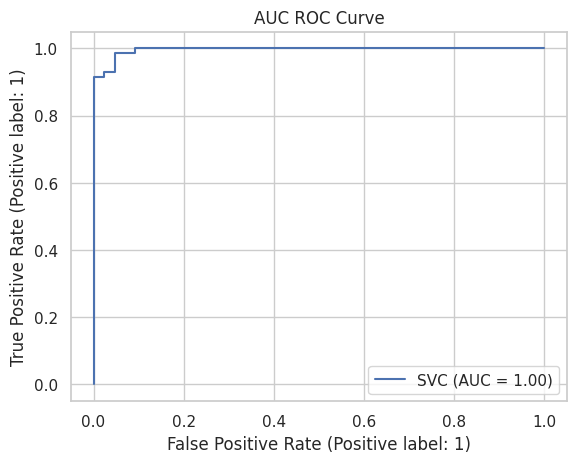

In [119]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_breast_cancer

# Load dataset and split into training and testing sets
data = load_breast_cancer()
x, y = data.data, data.target
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Train a Support Vector Classifier
svc = SVC(kernel='linear', probability=True, random_state=42)
svc.fit(x_train, y_train)

# Plot ROC curve using RocCurveDisplay
RocCurveDisplay.from_estimator(svc, x_test, y_test)
plt.title("AUC ROC Curve")
plt.show()


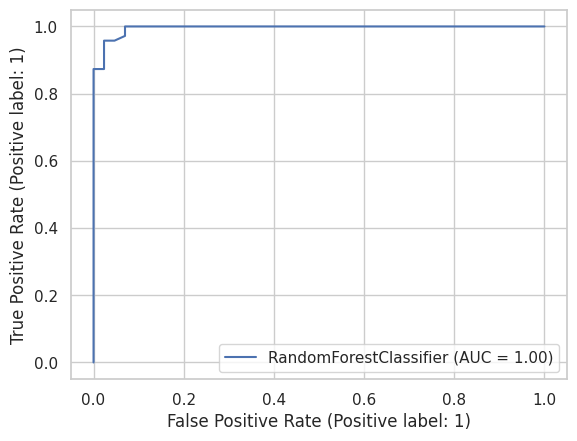

In [120]:
from sklearn.metrics import RocCurveDisplay

# Plot ROC curve using RocCurveDisplay
RocCurveDisplay.from_estimator(model, X_test, y_test)


*Finally we got the accuracy score as 86% and the AUC score is 100% which is very well good.*

# *Saving the model*

In [121]:
# Saving the Model

import joblib
joblib.dump(best_fit, "Rainfall_weather_forecast.pkl")

['Rainfall_weather_forecast.pkl']